Nama : Untara Eka Saputra

Kelas : IK - 3D

NIM :3.34.23.3.24

# **Praktikum 1. Deteksi Tepi menggunakan operator sobel**

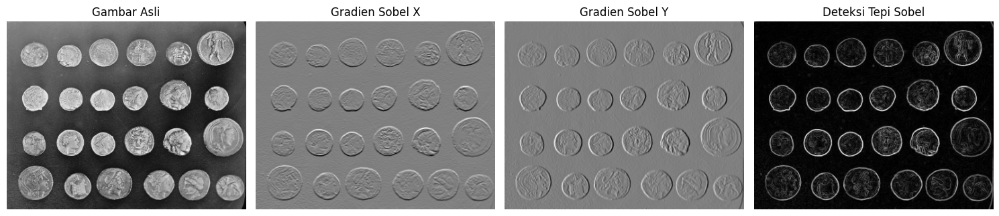

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

# Ambil gambar bawaan dari skimage
image = data.coins()  # Menggunakan gambar koin bawaan dari skimage

# Konversi ke grayscale jika perlu
if image.ndim == 3:
    gray_image = color.rgb2gray(image)
else:
    gray_image = image

# Hitung gradien menggunakan Operator Sobel
sobel_x = filters.sobel_h(gray_image)  # Sobel arah horizontal
sobel_y = filters.sobel_v(gray_image)  # Sobel arah vertikal
sobel_edge = filters.sobel(gray_image)  # Kombinasi keduanya

# Visualisasi hasil
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
ax = axes.ravel()

# Gambar asli
ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

# Gradien Sobel X
ax[1].imshow(sobel_x, cmap='gray')
ax[1].set_title("Gradien Sobel X")
ax[1].axis("off")

# Gradien Sobel Y
ax[2].imshow(sobel_y, cmap='gray')
ax[2].set_title("Gradien Sobel Y")
ax[2].axis("off")

# Hasil deteksi tepi
ax[3].imshow(sobel_edge, cmap='gray')
ax[3].set_title("Deteksi Tepi Sobel")
ax[3].axis("off")

plt.tight_layout()
plt.show()

### **operator sobel pada gambar berwarna.**

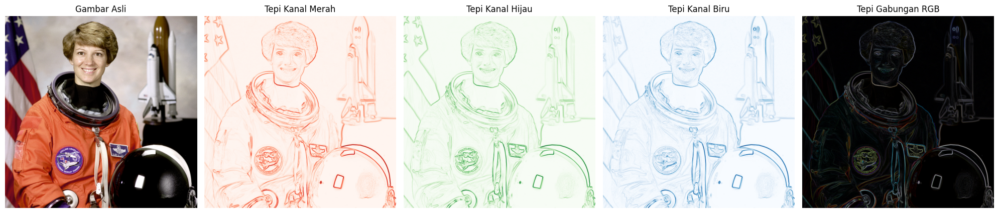

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters

# Ambil gambar bawaan dari skimage (gambar astronaut berwarna)
image = data.astronaut()  # Gambar berwarna

# Pisahkan kanal warna (RGB)
red_channel = image[:, :, 0]    # Kanal merah
green_channel = image[:, :, 1]  # Kanal hijau
blue_channel = image[:, :, 2]   # Kanal biru

# Terapkan Operator Sobel pada masing-masing kanal warna
sobel_red = filters.sobel(red_channel)
sobel_green = filters.sobel(green_channel)
sobel_blue = filters.sobel(blue_channel)

# Gabungkan hasil deteksi tepi dari ketiga kanal
sobel_color = np.stack((sobel_red, sobel_green, sobel_blue), axis=2)

# Visualisasi hasil
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
ax = axes.ravel()

# Gambar asli
ax[0].imshow(image)
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

# Kanal merah
ax[1].imshow(sobel_red, cmap='Reds')
ax[1].set_title("Tepi Kanal Merah")
ax[1].axis("off")

# Kanal hijau
ax[2].imshow(sobel_green, cmap='Greens')
ax[2].set_title("Tepi Kanal Hijau")
ax[2].axis("off")

# Kanal biru
ax[3].imshow(sobel_blue, cmap='Blues')
ax[3].set_title("Tepi Kanal Biru")
ax[3].axis("off")

# Gabungan RGB
ax[4].imshow(sobel_color)
ax[4].set_title("Tepi Gabungan RGB")
ax[4].axis("off")

plt.tight_layout()
plt.show()

# **Praktikum 2. Deteksi Tepi dengan operator Roberts**

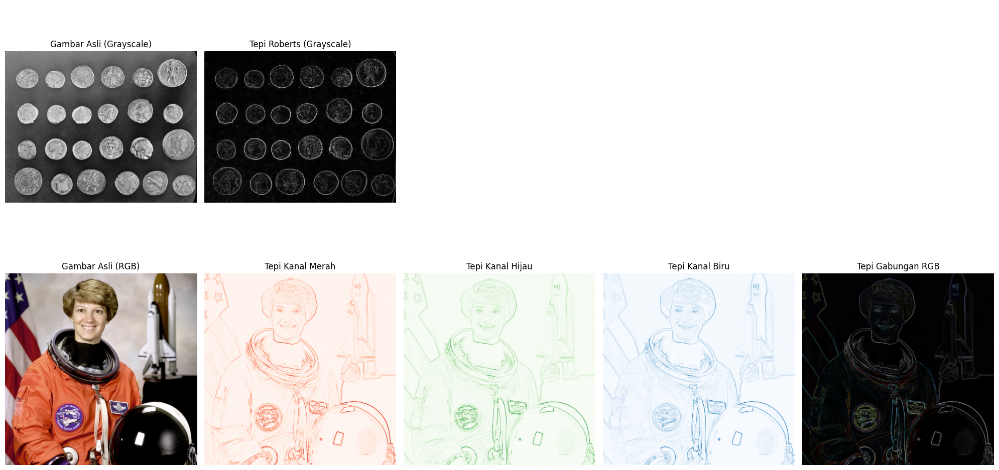

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters

# ===================== 1. DETEKSI TEPI ROBERTS (GRAYSCALE) =====================

# Ambil gambar grayscale dari skimage
image_gray = data.coins()  # Gambar koin (grayscale)

# Terapkan Operator Roberts
roberts_gray = filters.roberts(image_gray)

# ===================== 2. DETEKSI TEPI ROBERTS (BERWARNA) =====================

# Ambil gambar berwarna dari skimage
image_color = data.astronaut()  # Gambar astronaut (RGB)

# Pisahkan kanal warna (R, G, B)
red_channel = image_color[:, :, 0]
green_channel = image_color[:, :, 1]
blue_channel = image_color[:, :, 2]

# Terapkan Operator Roberts pada masing-masing kanal
roberts_red = filters.roberts(red_channel)
roberts_green = filters.roberts(green_channel)
roberts_blue = filters.roberts(blue_channel)

# Gabungkan hasil deteksi tepi dari ketiga kanal
roberts_color = np.stack(
    (roberts_red, roberts_green, roberts_blue),
    axis=2
)

# ===================== VISUALISASI HASIL =====================

fig, axes = plt.subplots(2, 5, figsize=(20, 10))
ax = axes.ravel()

# -------- Baris 1: Grayscale --------
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(roberts_gray, cmap='gray')
ax[1].set_title("Tepi Roberts (Grayscale)")
ax[1].axis("off")

# Kosongkan slot agar layout rapi
for i in range(2, 5):
    ax[i].axis("off")

# -------- Baris 2: RGB --------
ax[5].imshow(image_color)
ax[5].set_title("Gambar Asli (RGB)")
ax[5].axis("off")

ax[6].imshow(roberts_red, cmap='Reds')
ax[6].set_title("Tepi Kanal Merah")
ax[6].axis("off")

ax[7].imshow(roberts_green, cmap='Greens')
ax[7].set_title("Tepi Kanal Hijau")
ax[7].axis("off")

ax[8].imshow(roberts_blue, cmap='Blues')
ax[8].set_title("Tepi Kanal Biru")
ax[8].axis("off")

ax[9].imshow(roberts_color)
ax[9].set_title("Tepi Gabungan RGB")
ax[9].axis("off")

plt.tight_layout()
plt.show()

# **Praktikum 3. Perbandingan deteksi tepi dengan beberapa operator (Sobel,Roberts,Prewitt, Kirsch, dan Canny) pada citra grayscale**

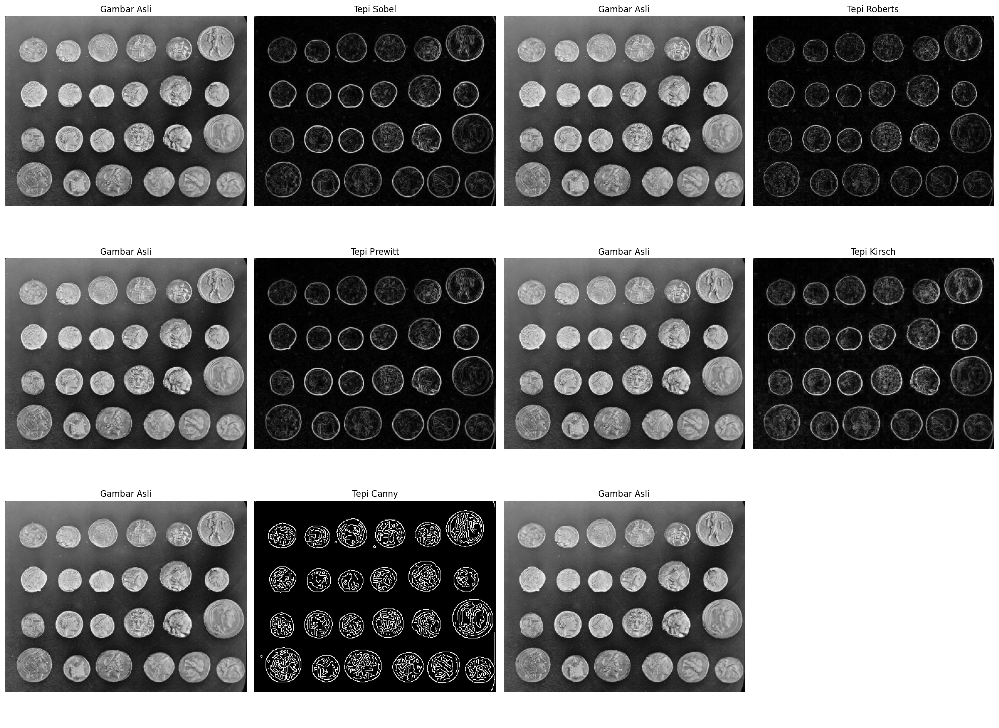

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1. AMBIL GAMBAR GRAYSCALE =====================
image_gray = data.coins()  # Gambar koin (grayscale)

# ===================== 2. DETEKSI TEPI =====================

# Operator Sobel
sobel_edge = filters.sobel(image_gray)

# Operator Roberts
roberts_edge = filters.roberts(image_gray)

# Operator Prewitt
prewitt_edge = filters.prewitt(image_gray)

# Operator Kirsch (pendekatan morfologi)
kirsch_edge = gradient(image_gray, disk(1))

# Operator Canny
canny_edge = feature.canny(image_gray, sigma=1)

# ===================== 3. VISUALISASI =====================

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

# -------- Baris 1: Sobel & Roberts --------
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

ax[1].imshow(sobel_edge, cmap='gray')
ax[1].set_title("Tepi Sobel")
ax[1].axis("off")

ax[2].imshow(image_gray, cmap='gray')
ax[2].set_title("Gambar Asli")
ax[2].axis("off")

ax[3].imshow(roberts_edge, cmap='gray')
ax[3].set_title("Tepi Roberts")
ax[3].axis("off")

# -------- Baris 2: Prewitt & Kirsch --------
ax[4].imshow(image_gray, cmap='gray')
ax[4].set_title("Gambar Asli")
ax[4].axis("off")

ax[5].imshow(prewitt_edge, cmap='gray')
ax[5].set_title("Tepi Prewitt")
ax[5].axis("off")

ax[6].imshow(image_gray, cmap='gray')
ax[6].set_title("Gambar Asli")
ax[6].axis("off")

ax[7].imshow(kirsch_edge, cmap='gray')
ax[7].set_title("Tepi Kirsch")
ax[7].axis("off")

# -------- Baris 3: Canny --------
ax[8].imshow(image_gray, cmap='gray')
ax[8].set_title("Gambar Asli")
ax[8].axis("off")

ax[9].imshow(canny_edge, cmap='gray')
ax[9].set_title("Tepi Canny")
ax[9].axis("off")

ax[10].imshow(image_gray, cmap='gray')
ax[10].set_title("Gambar Asli")
ax[10].axis("off")

# Kosongkan slot terakhir
ax[11].axis("off")

plt.tight_layout()
plt.show()

# **Praktikum 4. Perbandingan deteksi tepi dengan beberapa operator (Sobel, Roberts,Prewitt, Kirsch, dan Canny) pada citra**

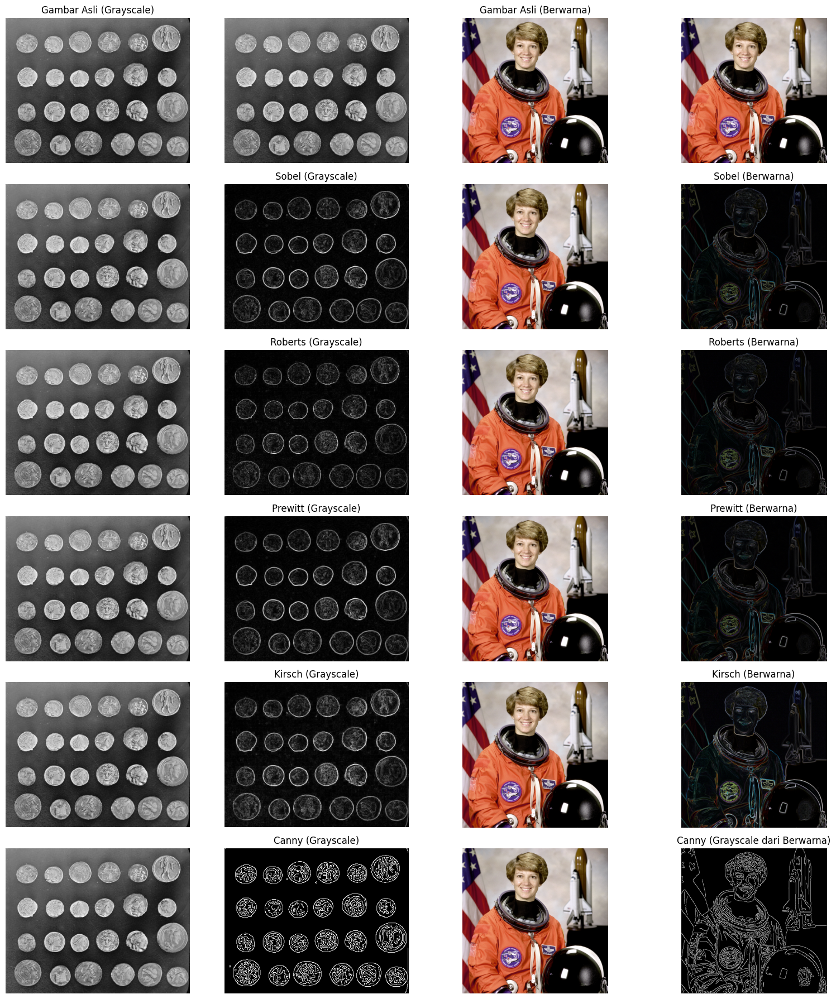

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature, color
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1. AMBIL GAMBAR =====================
image_gray = data.coins()
image_color = data.astronaut()

# ===================== 2. DETEKSI TEPI =====================
sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

def apply_edge(image, operator):
    r = operator(image[:, :, 0])
    g = operator(image[:, :, 1])
    b = operator(image[:, :, 2])
    return np.stack((r, g, b), axis=2)

sobel_color = apply_edge(image_color, filters.sobel)
roberts_color = apply_edge(image_color, filters.roberts)
prewitt_color = apply_edge(image_color, filters.prewitt)
kirsch_color = apply_edge(image_color, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)

# ===================== 3. VISUALISASI =====================
fig, axes = plt.subplots(6, 4, figsize=(16, 18))
ax = axes.ravel()

# ---- Baris 1: Asli ----
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis("off")

ax[1].imshow(image_gray, cmap='gray')
ax[1].axis("off")

ax[2].imshow(image_color)
ax[2].set_title("Gambar Asli (Berwarna)")
ax[2].axis("off")

ax[3].imshow(image_color)
ax[3].axis("off")

# ---- Baris 2: Sobel ----
ax[4].imshow(image_gray, cmap='gray')
ax[4].axis("off")

ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title("Sobel (Grayscale)")
ax[5].axis("off")

ax[6].imshow(image_color)
ax[6].axis("off")

ax[7].imshow(sobel_color)
ax[7].set_title("Sobel (Berwarna)")
ax[7].axis("off")

# ---- Baris 3: Roberts ----
ax[8].imshow(image_gray, cmap='gray')
ax[8].axis("off")

ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title("Roberts (Grayscale)")
ax[9].axis("off")

ax[10].imshow(image_color)
ax[10].axis("off")

ax[11].imshow(roberts_color)
ax[11].set_title("Roberts (Berwarna)")
ax[11].axis("off")

# ---- Baris 4: Prewitt ----
ax[12].imshow(image_gray, cmap='gray')
ax[12].axis("off")

ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title("Prewitt (Grayscale)")
ax[13].axis("off")

ax[14].imshow(image_color)
ax[14].axis("off")

ax[15].imshow(prewitt_color)
ax[15].set_title("Prewitt (Berwarna)")
ax[15].axis("off")

# ---- Baris 5: Kirsch ----
ax[16].imshow(image_gray, cmap='gray')
ax[16].axis("off")

ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title("Kirsch (Grayscale)")
ax[17].axis("off")

ax[18].imshow(image_color)
ax[18].axis("off")

ax[19].imshow(kirsch_color)
ax[19].set_title("Kirsch (Berwarna)")
ax[19].axis("off")

# ---- Baris 6: Canny ----
ax[20].imshow(image_gray, cmap='gray')
ax[20].axis("off")

ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title("Canny (Grayscale)")
ax[21].axis("off")

ax[22].imshow(image_color)
ax[22].axis("off")

ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title("Canny (Grayscale dari Berwarna)")
ax[23].axis("off")

plt.tight_layout()
plt.show()

# **3.	Buat program untuk melakukan perbandingan deteksi tepi dari beberapa operator menggunakan gambar yang kalian dapat dari handphone masing-masing (sehingga masing- masing mahasiswa gambar berbeda).**

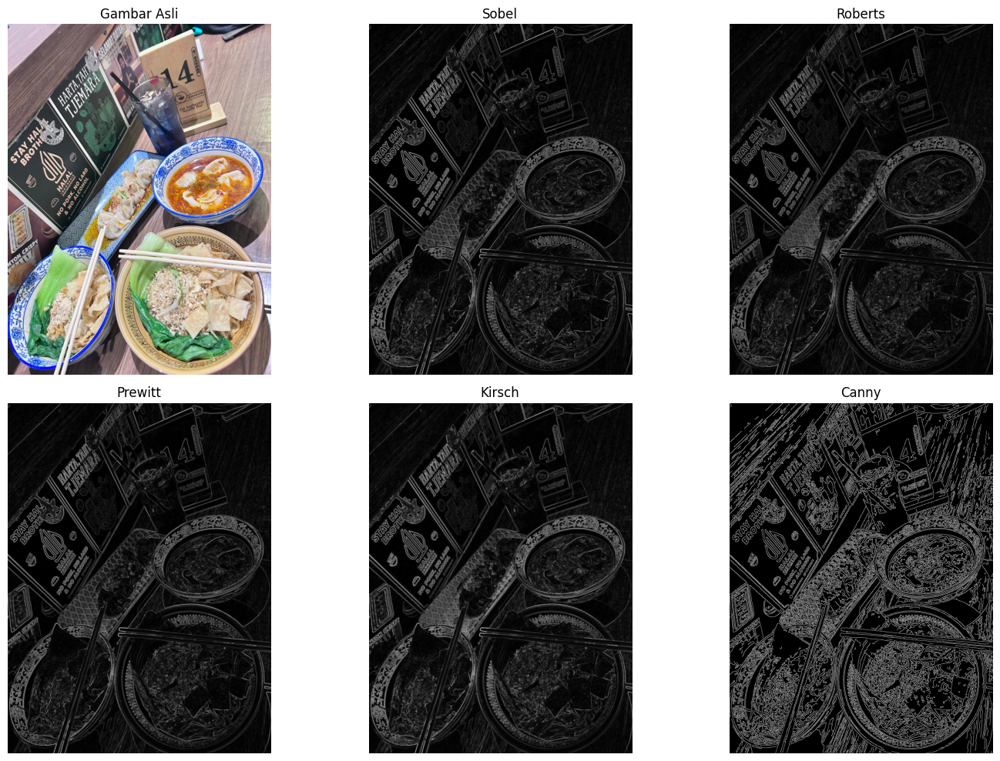

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ===================== 1. LOAD GAMBAR DARI HP =====================
# Ganti dengan path gambar kamu
image_path = "/content/gambar_saya.jpeg"
image_color = io.imread(image_path)

# Konversi ke grayscale
image_gray = color.rgb2gray(image_color)

# ===================== 2. DETEKSI TEPI =====================

# Sobel
sobel = filters.sobel(image_gray)

# Roberts
roberts = filters.roberts(image_gray)

# Prewitt
prewitt = filters.prewitt(image_gray)

# Kirsch (pendekatan morfologi)
# NOTE: harus ubah ke uint8 dulu
image_gray_uint8 = (image_gray * 255).astype(np.uint8)
kirsch = gradient(image_gray_uint8, disk(1))

# Canny
canny = feature.canny(image_gray, sigma=1)

# ===================== 3. VISUALISASI =====================

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
ax = axes.ravel()

# Gambar asli
ax[0].imshow(image_color)
ax[0].set_title("Gambar Asli")
ax[0].axis("off")

# Sobel
ax[1].imshow(sobel, cmap='gray')
ax[1].set_title("Sobel")
ax[1].axis("off")

# Roberts
ax[2].imshow(roberts, cmap='gray')
ax[2].set_title("Roberts")
ax[2].axis("off")

# Prewitt
ax[3].imshow(prewitt, cmap='gray')
ax[3].set_title("Prewitt")
ax[3].axis("off")

# Kirsch
ax[4].imshow(kirsch, cmap='gray')
ax[4].set_title("Kirsch")
ax[4].axis("off")

# Canny
ax[5].imshow(canny, cmap='gray')
ax[5].set_title("Canny")
ax[5].axis("off")

plt.tight_layout()
plt.show()